# Traffic Data Analysis
## Comprehensive Data Exploration and Preprocessing

This notebook focuses on data loading, exploration, and preprocessing for traffic prediction.
It prepares the data for model training in the separate training notebook.

**Workflow:**
1. Data Loading and Basic Statistics
2. Exploratory Data Analysis
3. Statistical Analysis
4. Data Quality Assessment
5. Temporal Pattern Analysis
6. Data Preprocessing and Export

In [62]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
from sklearn.preprocessing import StandardScaler, MinMaxScaler
import warnings
warnings.filterwarnings('ignore')

# Environment setup
import os
from dotenv import load_dotenv

# Load environment variables
load_dotenv()

# Set up output directory
OUT_DIR = os.path.join(os.getenv('OUT_DIR', '.'), "data_exploration")  # Default to current directory if not set
os.makedirs(OUT_DIR, exist_ok=True)

# Create plots directory
PLOTS_DIR = os.path.join(OUT_DIR, 'plots')
os.makedirs(PLOTS_DIR, exist_ok=True)

print(f"Output directory: {OUT_DIR}")
print(f"Plots directory: {PLOTS_DIR}")

# Set style for better plots
plt.style.use('seaborn-v0_8')
sns.set_palette("husl")

print("Traffic Data Analysis - Comprehensive Data Exploration")

Output directory: /Volumes/DATA SSD/Experimente/gsp/data_exploration
Plots directory: /Volumes/DATA SSD/Experimente/gsp/data_exploration/plots
Traffic Data Analysis - Comprehensive Data Exploration


## 1. Data Loading and Basic Statistics

In [63]:
class TrafficDataLoader:
    """Enhanced data loader for METR-LA traffic dataset with timezone handling"""

    def __init__(self, file_path=None, timezone='US/Pacific'):
        self.data = None
        self.sensor_ids = None
        self.timestamps = None
        self.scaler = StandardScaler()
        self.timezone = timezone

    def load_csv_data(self, file_path):
        """Load traffic data from CSV and localize timestamps"""
        df = pd.read_csv(file_path, index_col=0, parse_dates=True)
        # Zeitzone zuweisen und DST-Lücken verschieben
        df.index = df.index.tz_localize(
            self.timezone,
            ambiguous='infer',
            nonexistent='shift_forward'
        )
        df.columns = df.columns.astype(str)
        df = df.loc[:, (df != 0).any(axis=0)]
        df = df.dropna(axis=1, how='all')

        self.data = df
        self.sensor_ids = list(df.columns)
        self.timestamps = df.index
        return df

    def create_sample_data(self, n_sensors=50, n_timesteps=2000):
        """Create sample data if CSV not available"""
        timestamps = pd.date_range(
            '2012-03-01',
            periods=n_timesteps,
            freq='5min',
            tz=self.timezone
        )
        sensor_ids = [f"sensor_{i:03d}" for i in range(n_sensors)]
        base = np.sin(np.linspace(0, 8*np.pi, n_timesteps)) * 20 + 50
        data = []
        for _ in sensor_ids:
            noise = np.random.normal(0, 5, n_timesteps)
            pattern = np.maximum(base + noise + np.random.normal(0,10), 0)
            data.append(pattern)
        df = pd.DataFrame(np.array(data).T, index=timestamps, columns=sensor_ids)

        self.data = df
        self.sensor_ids = sensor_ids
        self.timestamps = timestamps
        return df

# Initialize data loader
data_loader = TrafficDataLoader()

# Try to load actual data, fallback to sample data
try:
    # Try to load from the provided file
    traffic_data = data_loader.load_csv_data('./data/METR-LA.csv')
    print("Successfully loaded METR-LA dataset")
except:
    print("Could not load CSV file, creating sample data instead")
    traffic_data = data_loader.create_sample_data(n_sensors=50, n_timesteps=1000)

# Display basic info
print("\nDataset Overview:")
print(f"Shape: {traffic_data.shape}")
print(f"Memory usage: {traffic_data.memory_usage(deep=True).sum() / 1024**2:.2f} MB")
print(f"Missing values: {traffic_data.isnull().sum().sum()}")
print(f"Date range: {traffic_data.index.min()} to {traffic_data.index.max()}")
print(f"Frequency: {traffic_data.index.freq if traffic_data.index.freq else 'Variable'}")

# Basic statistics
print("\nBasic Statistics:")
print(traffic_data.describe())

Successfully loaded METR-LA dataset

Dataset Overview:
Shape: (34272, 207)
Memory usage: 54.39 MB
Missing values: 0
Date range: 2012-03-01 00:00:00-08:00 to 2012-06-27 23:55:00-07:00
Frequency: Variable

Basic Statistics:
             773869        767541        767542        717447        717446  \
count  34272.000000  34272.000000  34272.000000  34272.000000  34272.000000   
mean      54.631359     60.452789     60.726120     49.524287     46.079798   
std       22.619199     15.970239     18.313353     15.843261     19.350345   
min        0.000000      0.000000      0.000000      0.000000      0.000000   
25%       60.364583     63.000000     65.444444     50.333333     34.666667   
50%       64.888889     65.000000     67.375000     53.875000     46.000000   
75%       66.875000     66.375000     68.444444     58.125000     64.500000   
max       70.000000     70.000000     70.000000     70.000000     70.000000   

             717445        773062        767620        737529     

## 2. Exploratory Data Analysis & Visualization

In [64]:
def plot_traffic_overview_separate(data, n_sensors=10):
    """Create separate traffic data visualizations as 4 individual plots"""
    
    print("Creating 4 separate traffic overview plots...")
    
    # 1. Time series for sample sensors
    print("Plot 1: Traffic Flow Over Time")
    fig1 = go.Figure()
    
    sample_sensors = data.columns[:n_sensors]
    colors = px.colors.qualitative.Set1
    
    for i, sensor in enumerate(sample_sensors):
        fig1.add_trace(
            go.Scatter(
                x=data.index, 
                y=data[sensor], 
                name=f'Sensor {sensor[:6]}...', 
                opacity=0.7, 
                mode='lines',
                line=dict(color=colors[i % len(colors)], width=1.5)
            )
        )
    
    fig1.update_layout(
        title="Traffic Flow Over Time (Sample Sensors)",
        xaxis_title="Time",
        yaxis_title="Traffic Flow",
        height=400,
        showlegend=True,
        legend=dict(orientation="h", yanchor="bottom", y=1.02, xanchor="right", x=1)
    )
    
    plot_path1 = os.path.join(PLOTS_DIR, 'traffic_timeseries.html')
    fig1.write_html(plot_path1)
    print(f"   Saved to: {plot_path1}")
    fig1.show()
    
    # 2. Average daily pattern
    print("\nPlot 2: Daily Traffic Pattern")
    data_hourly = data.groupby(data.index.hour).mean()
    avg_hourly = data_hourly.mean(axis=1)
    
    fig2 = go.Figure()
    fig2.add_trace(
        go.Scatter(
            x=list(range(24)), 
            y=avg_hourly, 
            mode='lines+markers', 
            name='Average Daily Pattern',
            line=dict(width=3, color='red'),
            marker=dict(size=8, color='darkred')
        )
    )
    
    fig2.update_layout(
        title="Average Daily Traffic Pattern",
        xaxis_title="Hour of Day",
        yaxis_title="Average Traffic Flow",
        height=400,
        showlegend=False,
        xaxis=dict(tickmode='linear', tick0=0, dtick=2)
    )
    
    plot_path2 = os.path.join(PLOTS_DIR, 'daily_pattern.html')
    fig2.write_html(plot_path2)
    print(f"   Saved to: {plot_path2}")
    fig2.show()
    
    # 3. Box plot for sensor distributions
    print("\nPlot 3: Sensor Traffic Distribution")
    sensor_stats = data.describe().T
    
    fig3 = go.Figure()
    fig3.add_trace(
        go.Box(
            y=sensor_stats['mean'], 
            name='Mean Traffic Distribution',
            boxpoints='outliers', 
            jitter=0.3,
            marker_color='lightblue',
            line_color='navy'
        )
    )
    
    fig3.update_layout(
        title="Distribution of Mean Traffic Flow by Sensor",
        yaxis_title="Mean Traffic Flow",
        height=400,
        showlegend=False
    )
    
    plot_path3 = os.path.join(PLOTS_DIR, 'sensor_distribution.html')
    fig3.write_html(plot_path3)
    print(f"   Saved to: {plot_path3}")
    fig3.show()
    
    # 4. Correlation heatmap (sample)
    print("\nPlot 4: Correlation Heatmap")
    n_corr_sensors = min(15, len(data.columns))  # Smaller sample for better visibility
    corr_matrix = data.iloc[:, :n_corr_sensors].corr()
    
    fig4 = go.Figure()
    fig4.add_trace(
        go.Heatmap(
            z=corr_matrix.values,
            x=[f'S{i+1}' for i in range(len(corr_matrix.columns))],  # Short labels
            y=[f'S{i+1}' for i in range(len(corr_matrix.columns))],
            colorscale='RdBu',
            zmid=0,
            colorbar=dict(title="Correlation"),
            text=corr_matrix.round(2).values,
            texttemplate="%{text}",
            textfont={"size": 8}
        )
    )
    
    fig4.update_layout(
        title=f"Correlation Matrix (First {n_corr_sensors} Sensors)",
        xaxis_title="Sensor",
        yaxis_title="Sensor",
        height=500,
        width=500
    )
    
    plot_path4 = os.path.join(PLOTS_DIR, 'correlation_heatmap.html')
    fig4.write_html(plot_path4)
    print(f"   Saved to: {plot_path4}")
    fig4.show()
    
    print(f"\nCreated 4 separate traffic overview plots in {PLOTS_DIR}")
    
    return {
        'timeseries': plot_path1,
        'daily_pattern': plot_path2, 
        'distribution': plot_path3,
        'correlation': plot_path4
    }

# Create separate traffic overview visualizations
plot_paths = plot_traffic_overview_separate(traffic_data, n_sensors=8)

Creating 4 separate traffic overview plots...
Plot 1: Traffic Flow Over Time
   Saved to: /Volumes/DATA SSD/Experimente/gsp/data_exploration/plots/traffic_timeseries.html



Plot 2: Daily Traffic Pattern
   Saved to: /Volumes/DATA SSD/Experimente/gsp/data_exploration/plots/daily_pattern.html



Plot 3: Sensor Traffic Distribution
   Saved to: /Volumes/DATA SSD/Experimente/gsp/data_exploration/plots/sensor_distribution.html



Plot 4: Correlation Heatmap
   Saved to: /Volumes/DATA SSD/Experimente/gsp/data_exploration/plots/correlation_heatmap.html



Created 4 separate traffic overview plots in /Volumes/DATA SSD/Experimente/gsp/data_exploration/plots


## 3. Statistical Analysis of Traffic Patterns

Saved statistical analysis plot to: /Volumes/DATA SSD/Experimente/gsp/data_exploration/plots/statistical_analysis.png


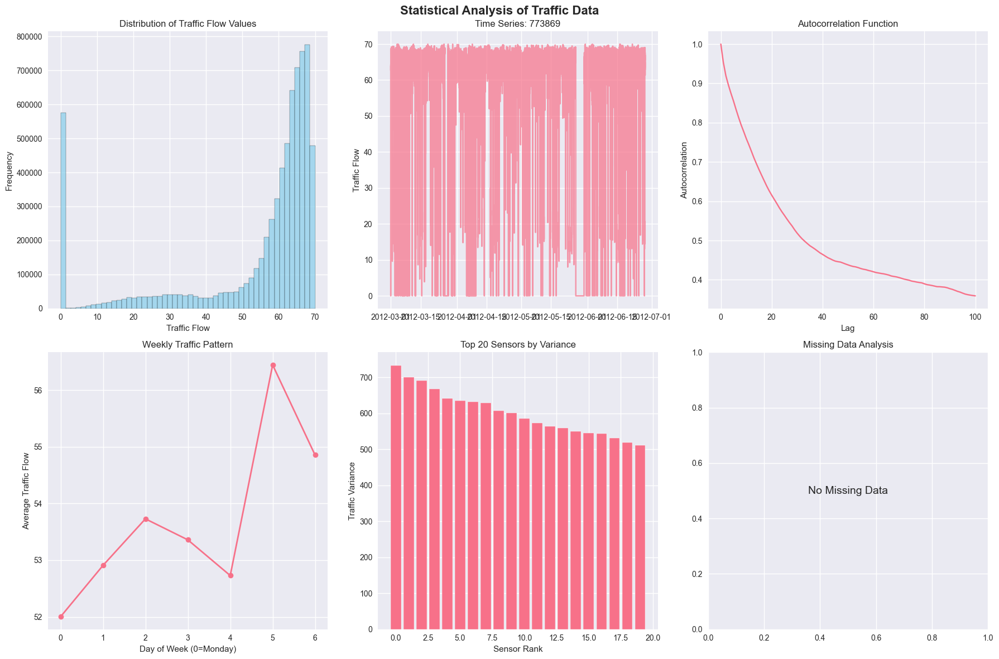

In [65]:
def plot_statistical_analysis(data):
    """Statistical analysis of traffic patterns"""
    
    fig, axes = plt.subplots(2, 3, figsize=(18, 12))
    fig.suptitle('Statistical Analysis of Traffic Data', fontsize=16, fontweight='bold')
    
    # 1. Distribution of traffic values
    axes[0,0].hist(data.values.flatten(), bins=50, alpha=0.7, color='skyblue', edgecolor='black')
    axes[0,0].set_title('Distribution of Traffic Flow Values')
    axes[0,0].set_xlabel('Traffic Flow')
    axes[0,0].set_ylabel('Frequency')
    
    # 2. Time series decomposition (sample sensor)
    sample_sensor = data.iloc[:, 0]
    axes[0,1].plot(sample_sensor.index, sample_sensor.values, alpha=0.7)
    axes[0,1].set_title(f'Time Series: {sample_sensor.name}')
    axes[0,1].set_ylabel('Traffic Flow')
    
    # 3. Autocorrelation
    from statsmodels.tsa.stattools import acf
    autocorr = acf(sample_sensor.dropna(), nlags=100, fft=True)
    axes[0,2].plot(autocorr)
    axes[0,2].set_title('Autocorrelation Function')
    axes[0,2].set_xlabel('Lag')
    axes[0,2].set_ylabel('Autocorrelation')
    
    # 4. Weekly pattern
    if len(data) > 7*24*12:  # If we have more than a week of 5-min data
        data_copy = data.copy()
        data_copy['weekday'] = data_copy.index.weekday
        weekly_pattern = data_copy.groupby('weekday').mean().mean(axis=1)
        axes[1,0].plot(weekly_pattern.index, weekly_pattern.values, 'o-', linewidth=2)
        axes[1,0].set_title('Weekly Traffic Pattern')
        axes[1,0].set_xlabel('Day of Week (0=Monday)')
        axes[1,0].set_ylabel('Average Traffic Flow')
        axes[1,0].set_xticks(range(7))
    
    # 5. Sensor variance analysis
    sensor_vars = data.var().sort_values(ascending=False)
    axes[1,1].bar(range(min(20, len(sensor_vars))), sensor_vars.iloc[:20].values)
    axes[1,1].set_title('Top 20 Sensors by Variance')
    axes[1,1].set_xlabel('Sensor Rank')
    axes[1,1].set_ylabel('Traffic Variance')
    
    # 6. Missing data pattern
    missing_data = data.isnull().sum().sort_values(ascending=False)
    if missing_data.sum() > 0:
        axes[1,2].bar(range(min(20, len(missing_data))), missing_data.iloc[:20].values)
        axes[1,2].set_title('Missing Data by Sensor')
        axes[1,2].set_xlabel('Sensor Rank')
        axes[1,2].set_ylabel('Missing Values')
    else:
        axes[1,2].text(0.5, 0.5, 'No Missing Data', ha='center', va='center', 
                      transform=axes[1,2].transAxes, fontsize=14)
        axes[1,2].set_title('Missing Data Analysis')
    
    plt.tight_layout()
    
    # Save plot to OUT_DIR
    plot_path = os.path.join(PLOTS_DIR, 'statistical_analysis.png')
    plt.savefig(plot_path, dpi=300, bbox_inches='tight')
    print(f"Saved statistical analysis plot to: {plot_path}")
    
    plt.show()

# Run statistical analysis
plot_statistical_analysis(traffic_data)

## 4. Data Quality Assessment

Data Quality Assessment:
Missing values: 0 (0.00%)
Zero values: 575302 (8.11%)
Negative values: 0 (0.00%)
Outliers: 845638 (11.92%)
Duplicate timestamps: 12

Data Consistency:
Min value: 0.00
Max value: 70.00
Mean value: 53.72
Std value: 19.19
Saved data quality metrics plot to: /Volumes/DATA SSD/Experimente/gsp/data_exploration/plots/data_quality_metrics.png


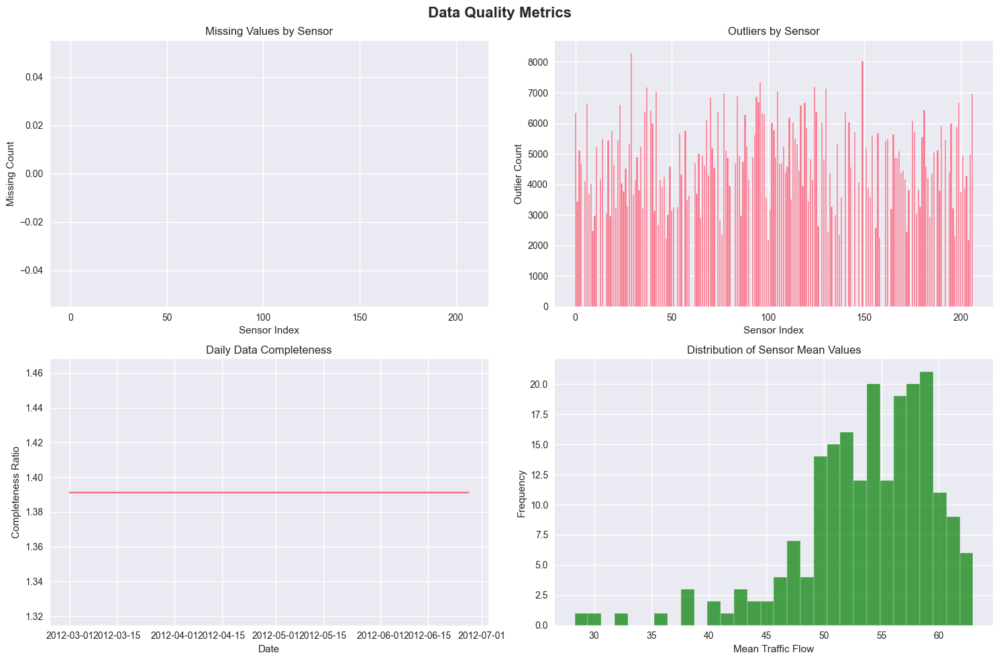

In [66]:
def assess_data_quality(data):
    """Comprehensive data quality assessment"""
    
    print("Data Quality Assessment:")
    print("=" * 40)
    
    # Missing values
    missing_by_sensor = data.isnull().sum()
    missing_total = missing_by_sensor.sum()
    print(f"Missing values: {missing_total} ({missing_total/data.size*100:.2f}%)")
    
    # Zero values
    zero_by_sensor = (data == 0).sum()
    zero_total = zero_by_sensor.sum()
    print(f"Zero values: {zero_total} ({zero_total/data.size*100:.2f}%)")
    
    # Negative values
    negative_by_sensor = (data < 0).sum()
    negative_total = negative_by_sensor.sum()
    print(f"Negative values: {negative_total} ({negative_total/data.size*100:.2f}%)")
    
    # Outliers (using IQR method)
    Q1 = data.quantile(0.25)
    Q3 = data.quantile(0.75)
    IQR = Q3 - Q1
    outliers = ((data < (Q1 - 1.5 * IQR)) | (data > (Q3 + 1.5 * IQR))).sum()
    outliers_total = outliers.sum()
    print(f"Outliers: {outliers_total} ({outliers_total/data.size*100:.2f}%)")
    
    # Duplicate timestamps
    duplicate_timestamps = data.index.duplicated().sum()
    print(f"Duplicate timestamps: {duplicate_timestamps}")
    
    # Data consistency
    print(f"\nData Consistency:")
    print(f"Min value: {data.min().min():.2f}")
    print(f"Max value: {data.max().max():.2f}")
    print(f"Mean value: {data.mean().mean():.2f}")
    print(f"Std value: {data.std().mean():.2f}")
    
    # Plot quality metrics
    fig, axes = plt.subplots(2, 2, figsize=(15, 10))
    fig.suptitle('Data Quality Metrics', fontsize=16, fontweight='bold')
    
    # Missing values by sensor
    axes[0,0].bar(range(len(missing_by_sensor)), missing_by_sensor.values)
    axes[0,0].set_title('Missing Values by Sensor')
    axes[0,0].set_xlabel('Sensor Index')
    axes[0,0].set_ylabel('Missing Count')
    
    # Outliers by sensor
    axes[0,1].bar(range(len(outliers)), outliers.values)
    axes[0,1].set_title('Outliers by Sensor')
    axes[0,1].set_xlabel('Sensor Index')
    axes[0,1].set_ylabel('Outlier Count')
    
    # Data completeness over time
    daily_completeness = data.resample('D').count().mean(axis=1) / len(data.columns)
    axes[1,0].plot(daily_completeness.index, daily_completeness.values)
    axes[1,0].set_title('Daily Data Completeness')
    axes[1,0].set_xlabel('Date')
    axes[1,0].set_ylabel('Completeness Ratio')
    
    # Sensor mean values distribution
    sensor_means = data.mean()
    axes[1,1].hist(sensor_means.values, bins=30, alpha=0.7, color='green')
    axes[1,1].set_title('Distribution of Sensor Mean Values')
    axes[1,1].set_xlabel('Mean Traffic Flow')
    axes[1,1].set_ylabel('Frequency')
    
    plt.tight_layout()
    
    # Save plot to OUT_DIR
    plot_path = os.path.join(PLOTS_DIR, 'data_quality_metrics.png')
    plt.savefig(plot_path, dpi=300, bbox_inches='tight')
    print(f"Saved data quality metrics plot to: {plot_path}")
    
    plt.show()
    
    return {
        'missing_values': missing_total,
        'zero_values': zero_total,
        'negative_values': negative_total,
        'outliers': outliers_total,
        'duplicate_timestamps': duplicate_timestamps
    }

# Assess data quality
quality_metrics = assess_data_quality(traffic_data)

## 5. Temporal Pattern Analysis

Temporal Pattern Analysis:


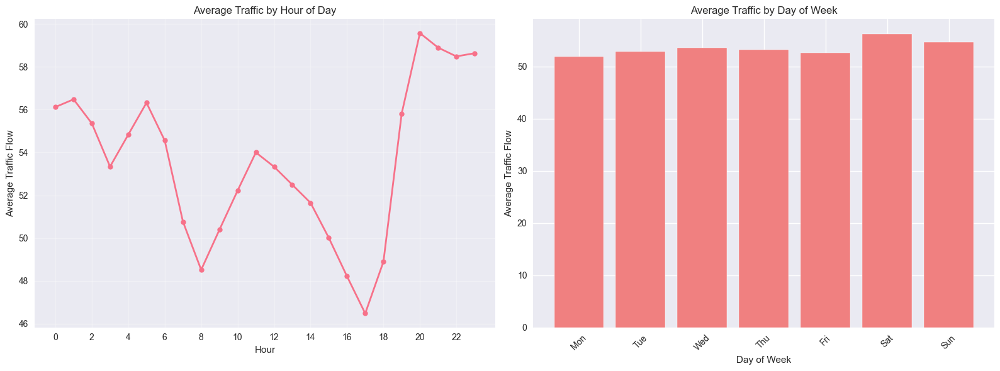

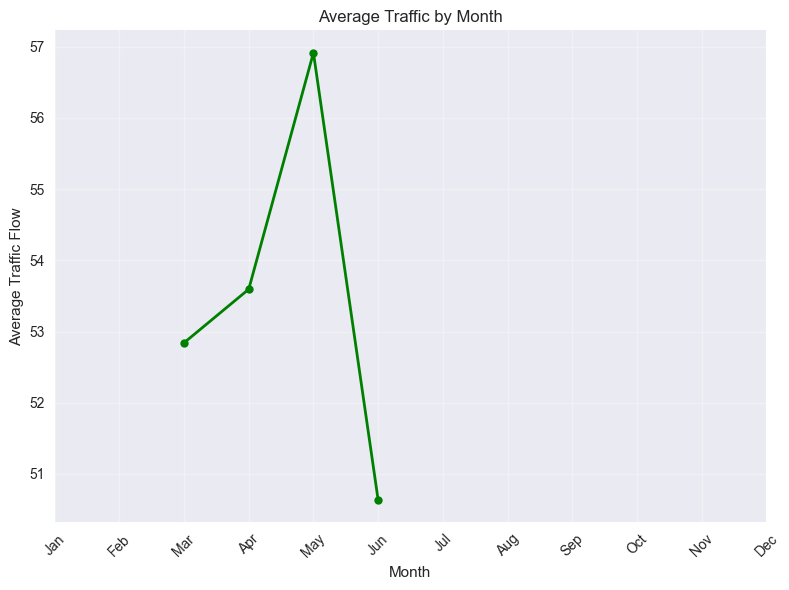

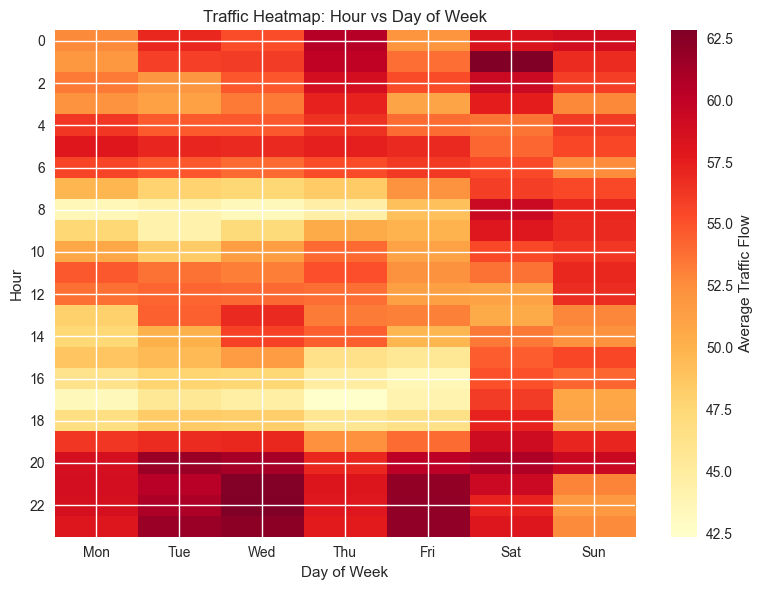

Peak hour: 20:00
Low hour: 17:00
Peak day: Sat
Low day: Mon


In [67]:
import matplotlib.pyplot as plt
import os

def analyze_temporal_patterns(data):
    """Analyze temporal patterns in traffic data"""

    print("Temporal Pattern Analysis:")
    print("=" * 40)

    # Create time-based features
    data_temp = data.copy()
    data_temp['hour'] = data_temp.index.hour
    data_temp['day_of_week'] = data_temp.index.dayofweek
    data_temp['month'] = data_temp.index.month
    data_temp['day_of_year'] = data_temp.index.dayofyear

    # Calculate patterns
    hourly_pattern = data_temp.groupby('hour').mean().mean(axis=1)
    daily_pattern = data_temp.groupby('day_of_week').mean().mean(axis=1)
    monthly_pattern = data_temp.groupby('month').mean().mean(axis=1)

    # Create a single figure for hourly and daily patterns
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))  # 1 row, 2 columns

    # Hourly pattern
    axes[0].plot(hourly_pattern.index, hourly_pattern.values, 'o-', linewidth=2, markersize=6)
    axes[0].set_title('Average Traffic by Hour of Day')
    axes[0].set_xlabel('Hour')
    axes[0].set_ylabel('Average Traffic Flow')
    axes[0].grid(True, alpha=0.3)
    axes[0].set_xticks(range(0, 24, 2))

    # Daily pattern
    days = ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']
    axes[1].bar(days, daily_pattern.values, color='lightcoral')
    axes[1].set_title('Average Traffic by Day of Week')
    axes[1].set_xlabel('Day of Week')
    axes[1].set_ylabel('Average Traffic Flow')
    axes[1].tick_params(axis='x', rotation=45)

    # Save the combined hourly & daily plot
    plt.tight_layout()
    plt.savefig(os.path.join(PLOTS_DIR, 'hourly_daily_pattern.png'), dpi=300)
    plt.show()

    # Monthly pattern
    plt.figure(figsize=(8, 6))
    months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
    plt.plot(monthly_pattern.index, monthly_pattern.values, 'o-', linewidth=2, markersize=6, color='green')
    plt.title('Average Traffic by Month')
    plt.xlabel('Month')
    plt.ylabel('Average Traffic Flow')
    plt.grid(True, alpha=0.3)
    plt.xticks(range(1, 13), months, rotation=45)
    plt.tight_layout()
    plt.savefig(os.path.join(PLOTS_DIR, 'monthly_pattern.png'), dpi=300)
    plt.show()

    # Heatmap of hour vs day of week
    plt.figure(figsize=(8, 6))
    pivot_table = data_temp.groupby(['hour', 'day_of_week']).mean().mean(axis=1).unstack()
    im = plt.imshow(pivot_table.values, cmap='YlOrRd', aspect='auto')
    plt.title('Traffic Heatmap: Hour vs Day of Week')
    plt.xlabel('Day of Week')
    plt.ylabel('Hour')
    plt.xticks(range(7), ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'])
    plt.yticks(range(0, 24, 2), range(0, 24, 2))
    cbar = plt.colorbar(im)
    cbar.set_label('Average Traffic Flow')
    plt.tight_layout()
    plt.savefig(os.path.join(PLOTS_DIR, 'heatmap.png'), dpi=300)
    plt.show()

    # Summary statistics
    print(f"Peak hour: {hourly_pattern.idxmax()}:00")
    print(f"Low hour: {hourly_pattern.idxmin()}:00")
    print(f"Peak day: {days[daily_pattern.idxmax()]}")
    print(f"Low day: {days[daily_pattern.idxmin()]}")

    return {
        'hourly_pattern': hourly_pattern,
        'daily_pattern': daily_pattern,
        'monthly_pattern': monthly_pattern
    }

# Analyze temporal patterns
temporal_patterns = analyze_temporal_patterns(traffic_data)

## 6. Correlation Analysis

Running enhanced correlation analysis with clustering (4 separate plots)...
Enhanced Sensor Correlation Analysis with Clustering:
Calculating full correlation matrix for clustering...
   Full dataset: 207 sensors
Created 30 clusters from 207 sensors
Selected 30 representative sensors from clusters

Cluster Information (Top 15):
ID   Size   Representative  Avg Corr   Cluster Corr
------------------------------------------------------------
1    9      767470          0.924      0.895
2    9      717580          0.921      0.894
3    2      764424          0.947      0.947
4    32     767541          0.910      0.864
5    1      718072          1.000      1.000
6    1      760987          1.000      1.000
7    1      718076          1.000      1.000
8    4      759602          0.910      0.892
9    4      718371          0.874      0.842
10   6      718089          0.897      0.859
11   3      716943          0.901      0.869
12   1      716939          1.000      1.000
13   2      71749

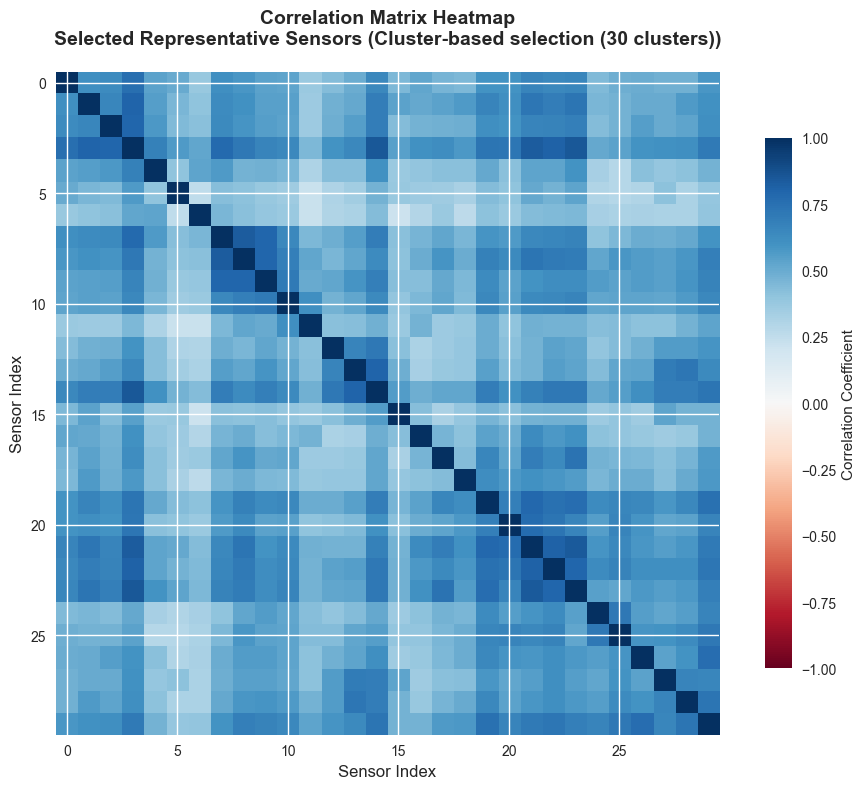


Plot 2: Correlation Distribution
   Saved to: /Volumes/DATA SSD/Experimente/gsp/data_exploration/plots/correlation_distribution.png


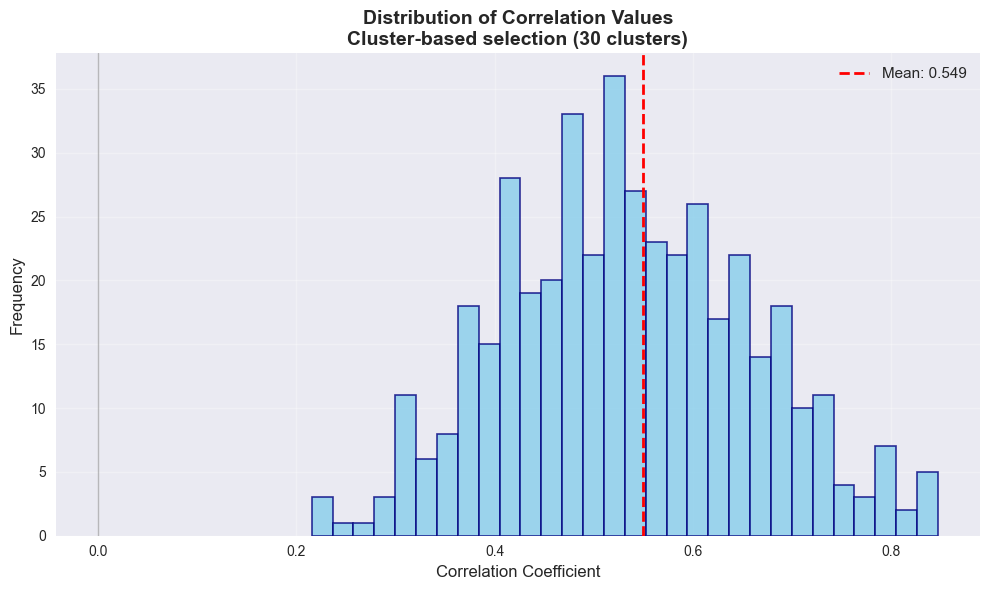


Plot 3: Hierarchical Clustering Dendrogram
   Saved to: /Volumes/DATA SSD/Experimente/gsp/data_exploration/plots/hierarchical_clustering.png


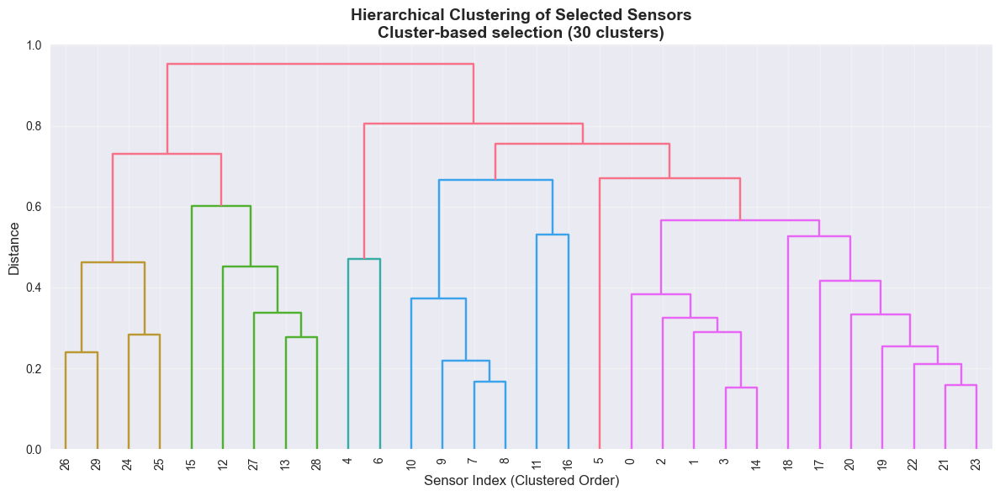


Plot 4: Average Correlation by Sensor
   Saved to: /Volumes/DATA SSD/Experimente/gsp/data_exploration/plots/avg_correlation_by_sensor.png


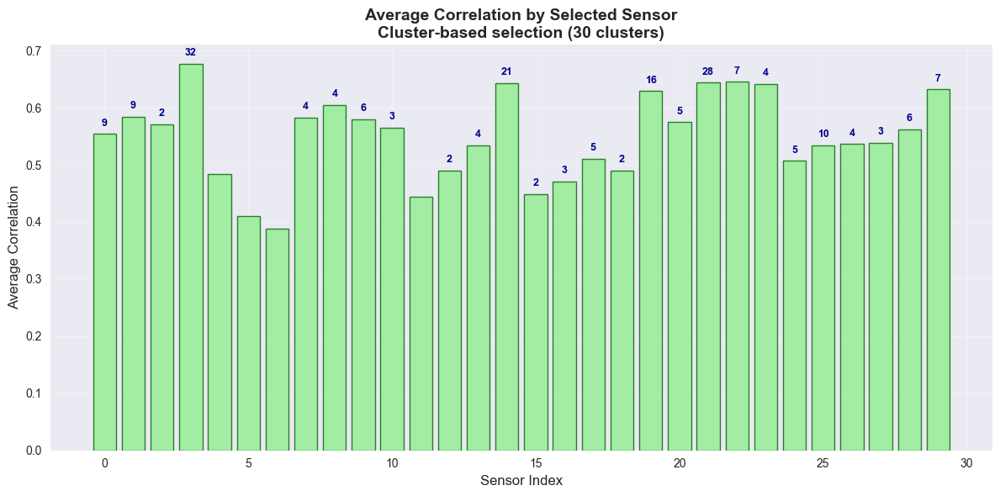


CLUSTERING SUMMARY:
   Total sensors analyzed: 207
   Clusters created: 30
   Representative sensors selected: 30
   Average cluster size: 6.9
   Largest cluster: 32 sensors
   Smallest cluster: 1 sensor(s)

Top 5 Largest Clusters:
   Cluster 4: 32 sensors → 767541
   Cluster 22: 28 sensors → 764949
   Cluster 15: 21 sensors → 767542
   Cluster 20: 16 sensors → 717497
   Cluster 26: 10 sensors → 717453

Created 4 separate enhanced correlation analysis plots in /Volumes/DATA SSD/Experimente/gsp/data_exploration/plots


In [68]:
def analyze_sensor_correlations_with_clustering(data, max_sensors=50, use_clustering=True):
    """Analyze correlations between sensors with cluster-based selection - 4 separate plots"""
    
    print("Enhanced Sensor Correlation Analysis with Clustering:")
    print("=" * 60)
    
    if use_clustering:
        # Step 1: Calculate full correlation matrix for clustering
        print("Calculating full correlation matrix for clustering...")
        full_corr_matrix = data.corr()
        print(f"   Full dataset: {data.shape[1]} sensors")
        
        # Step 2: Perform hierarchical clustering on all sensors
        from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
        from scipy.spatial.distance import squareform
        
        # Convert correlation to distance (1 - |correlation|)
        distance_matrix = 1 - full_corr_matrix.abs()
        condensed_distances = squareform(distance_matrix)
        
        # Hierarchical clustering using Ward method
        linkage_matrix = linkage(condensed_distances, method='ward')
        
        # Step 3: Cut dendrogram to get desired number of clusters
        n_clusters = min(max_sensors, len(data.columns) // 3)  # ~3 sensors per cluster
        cluster_labels = fcluster(linkage_matrix, n_clusters, criterion='maxclust')
        
        print(f"Created {n_clusters} clusters from {len(data.columns)} sensors")
        
        # Step 4: Select representative sensors from each cluster
        selected_sensors = []
        cluster_info = {}
        
        for cluster_id in range(1, n_clusters + 1):
            # Get sensors in this cluster
            cluster_sensor_indices = [i for i, label in enumerate(cluster_labels) if label == cluster_id]
            cluster_sensors = [data.columns[i] for i in cluster_sensor_indices]
            
            if len(cluster_sensors) == 0:
                continue
                
            # Calculate average correlation within cluster for each sensor
            cluster_corr_matrix = full_corr_matrix.loc[cluster_sensors, cluster_sensors]
            avg_corr_in_cluster = cluster_corr_matrix.abs().mean()
            
            # Select sensor with highest average correlation within cluster (most representative)
            representative_sensor = avg_corr_in_cluster.idxmax()
            selected_sensors.append(representative_sensor)
            
            # Store cluster information
            cluster_info[cluster_id] = {
                'representative': representative_sensor,
                'sensors': cluster_sensors,
                'size': len(cluster_sensors),
                'avg_internal_corr': avg_corr_in_cluster[representative_sensor],
                'cluster_mean_corr': cluster_corr_matrix.abs().mean().mean()
            }
            
            if len(selected_sensors) >= max_sensors:
                break
        
        print(f"Selected {len(selected_sensors)} representative sensors from clusters")
        
        # Display cluster information
        print(f"\nCluster Information (Top 15):")
        print(f"{'ID':<4} {'Size':<6} {'Representative':<15} {'Avg Corr':<10} {'Cluster Corr':<12}")
        print("-" * 60)
        
        for cluster_id, info in list(cluster_info.items())[:15]:
            rep_short = info['representative'][:12] + "..." if len(info['representative']) > 15 else info['representative']
            print(f"{cluster_id:<4} {info['size']:<6} {rep_short:<15} {info['avg_internal_corr']:.3f}      {info['cluster_mean_corr']:.3f}")
        
        if len(cluster_info) > 15:
            print(f"... and {len(cluster_info) - 15} more clusters")
        
        # Create correlation matrix for selected sensors
        data_sample = data[selected_sensors]
        corr_matrix = data_sample.corr()
        
        selection_method = f"Cluster-based selection ({n_clusters} clusters)"
        
    else:
        # Original method: just take first max_sensors
        print("Using original method: first sensors")
        data_sample = data.iloc[:, :max_sensors]
        corr_matrix = data_sample.corr()
        selected_sensors = data_sample.columns.tolist()
        cluster_info = {}
        selection_method = f"First {max_sensors} sensors"
    
    # Statistics
    mean_corr = corr_matrix.abs().mean().mean()
    max_corr = corr_matrix.abs().max().max()
    min_corr = corr_matrix.abs().min().min()
    
    print(f"\nCorrelation Statistics for Selected Sensors:")
    print(f"   Selection method: {selection_method}")
    print(f"   Mean correlation: {mean_corr:.3f}")
    print(f"   Max correlation: {max_corr:.3f}")
    print(f"   Min correlation: {min_corr:.3f}")
    
    # Compare with full dataset
    if use_clustering:
        full_mean_corr = full_corr_matrix.abs().mean().mean()
        print(f"   Full dataset mean: {full_mean_corr:.3f}")
        improvement = ((mean_corr / full_mean_corr - 1) * 100)
        print(f"   Correlation improvement: {improvement:+.1f}%")
    
    # Find highly correlated pairs
    corr_pairs = []
    for i in range(len(corr_matrix.columns)):
        for j in range(i+1, len(corr_matrix.columns)):
            corr_val = corr_matrix.iloc[i, j]
            if abs(corr_val) > 0.7:  # High correlation threshold
                corr_pairs.append((corr_matrix.columns[i], corr_matrix.columns[j], corr_val))
    
    corr_pairs.sort(key=lambda x: abs(x[2]), reverse=True)
    print(f"\nHighly correlated pairs (|r| > 0.7): {len(corr_pairs)}")
    for i, pair in enumerate(corr_pairs[:10], 1):  # Show first 10
        sensor1_short = pair[0][:8] + "..." if len(pair[0]) > 10 else pair[0]
        sensor2_short = pair[1][:8] + "..." if len(pair[1]) > 10 else pair[1]
        print(f"   {i:2d}. {sensor1_short} ↔ {sensor2_short}: {pair[2]:+.3f}")
    
    print(f"\nCreating 4 separate visualizations...")
    
    # PLOT 1: Correlation Matrix Heatmap
    print("Plot 1: Correlation Matrix Heatmap")
    fig1, ax1 = plt.subplots(figsize=(10, 8))
    
    im1 = ax1.imshow(corr_matrix.values, cmap='RdBu', vmin=-1, vmax=1)
    ax1.set_title(f'Correlation Matrix Heatmap\nSelected Representative Sensors ({selection_method})',
                  fontsize=14, fontweight='bold', pad=20)
    ax1.set_xlabel('Sensor Index', fontsize=12)
    ax1.set_ylabel('Sensor Index', fontsize=12)
    
    cbar1 = plt.colorbar(im1, ax=ax1, shrink=0.8)
    cbar1.set_label('Correlation Coefficient', fontsize=11)
    
    plt.tight_layout()
    plot_path1 = os.path.join(PLOTS_DIR, 'enhanced_correlation_heatmap.png')
    plt.savefig(plot_path1, dpi=300, bbox_inches='tight')
    print(f"   Saved to: {plot_path1}")
    plt.show()
    
    # PLOT 2: Correlation Distribution
    print("\nPlot 2: Correlation Distribution")
    fig2, ax2 = plt.subplots(figsize=(10, 6))
    
    corr_values = corr_matrix.values[np.triu_indices_from(corr_matrix.values, k=1)]
    ax2.hist(corr_values, bins=30, alpha=0.8, color='skyblue', edgecolor='navy', linewidth=1.2)
    ax2.set_title(f'Distribution of Correlation Values\n{selection_method}', 
                  fontsize=14, fontweight='bold')
    ax2.set_xlabel('Correlation Coefficient', fontsize=12)
    ax2.set_ylabel('Frequency', fontsize=12)
    ax2.axvline(mean_corr, color='red', linestyle='--', linewidth=2, label=f'Mean: {mean_corr:.3f}')
    ax2.axvline(0, color='gray', linestyle='-', alpha=0.5, linewidth=1)
    ax2.legend(fontsize=11)
    ax2.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plot_path2 = os.path.join(PLOTS_DIR, 'correlation_distribution.png')
    plt.savefig(plot_path2, dpi=300, bbox_inches='tight')
    print(f"   Saved to: {plot_path2}")
    plt.show()
    
    # PLOT 3: Hierarchical Clustering Dendrogram
    print("\nPlot 3: Hierarchical Clustering Dendrogram")
    fig3, ax3 = plt.subplots(figsize=(12, 6))
    
    # Convert correlation to distance for selected sensors
    distance_matrix_selected = 1 - corr_matrix.abs()
    condensed_distances_selected = squareform(distance_matrix_selected)
    
    # Hierarchical clustering for selected sensors
    linkage_matrix_selected = linkage(condensed_distances_selected, method='ward')
    dendro = dendrogram(linkage_matrix_selected, ax=ax3, labels=None, leaf_rotation=90,
                       color_threshold=0.7*max(linkage_matrix_selected[:,2]))
    ax3.set_title(f'Hierarchical Clustering of Selected Sensors\n{selection_method}', 
                  fontsize=14, fontweight='bold')
    ax3.set_xlabel('Sensor Index (Clustered Order)', fontsize=12)
    ax3.set_ylabel('Distance', fontsize=12)
    ax3.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plot_path3 = os.path.join(PLOTS_DIR, 'hierarchical_clustering.png')
    plt.savefig(plot_path3, dpi=300, bbox_inches='tight')
    print(f"   Saved to: {plot_path3}")
    plt.show()
    
    # PLOT 4: Average Correlation by Sensor
    print("\nPlot 4: Average Correlation by Sensor")
    fig4, ax4 = plt.subplots(figsize=(12, 6))
    
    avg_corr_by_sensor = corr_matrix.abs().mean()
    bars = ax4.bar(range(len(avg_corr_by_sensor)), avg_corr_by_sensor.values, 
                   alpha=0.8, color='lightgreen', edgecolor='darkgreen', linewidth=1)
    ax4.set_title(f'Average Correlation by Selected Sensor\n{selection_method}', 
                  fontsize=14, fontweight='bold')
    ax4.set_xlabel('Sensor Index', fontsize=12)
    ax4.set_ylabel('Average Correlation', fontsize=12)
    ax4.grid(True, alpha=0.3)
    
    # Add cluster size information as text on bars (if clustering was used)
    if use_clustering and cluster_info:
        for i, (sensor, bar) in enumerate(zip(selected_sensors, bars)):
            # Find which cluster this sensor represents
            cluster_size = 1
            for info in cluster_info.values():
                if info['representative'] == sensor:
                    cluster_size = info['size']
                    break
            
            if cluster_size > 1:  # Only show if representing more than 1 sensor
                ax4.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.01, 
                        f'{cluster_size}', ha='center', va='bottom', fontsize=9, fontweight='bold',
                        color='darkblue')
    
    plt.tight_layout()
    plot_path4 = os.path.join(PLOTS_DIR, 'avg_correlation_by_sensor.png')
    plt.savefig(plot_path4, dpi=300, bbox_inches='tight')
    print(f"   Saved to: {plot_path4}")
    plt.show()
    
    # Summary statistics
    if use_clustering:
        print(f"\nCLUSTERING SUMMARY:")
        print(f"   Total sensors analyzed: {len(data.columns)}")
        print(f"   Clusters created: {len(cluster_info)}")
        print(f"   Representative sensors selected: {len(selected_sensors)}")
        print(f"   Average cluster size: {sum(info['size'] for info in cluster_info.values()) / len(cluster_info):.1f}")
        print(f"   Largest cluster: {max(info['size'] for info in cluster_info.values())} sensors")
        print(f"   Smallest cluster: {min(info['size'] for info in cluster_info.values())} sensor(s)")
        
        # Show which sensors represent the largest clusters
        largest_clusters = sorted(cluster_info.items(), key=lambda x: x[1]['size'], reverse=True)[:5]
        print(f"\nTop 5 Largest Clusters:")
        for cluster_id, info in largest_clusters:
            rep_short = info['representative'][:15] + "..." if len(info['representative']) > 18 else info['representative']
            print(f"   Cluster {cluster_id}: {info['size']} sensors → {rep_short}")
    
    print(f"\nCreated 4 separate enhanced correlation analysis plots in {PLOTS_DIR}")
    
    # Return paths to all plots
    plot_paths = {
        'heatmap': plot_path1,
        'distribution': plot_path2,
        'clustering': plot_path3,
        'avg_correlation': plot_path4
    }
    
    return corr_matrix, selected_sensors, cluster_info if use_clustering else {}, plot_paths

# Enhanced correlation analysis with clustering - 4 separate plots
print("Running enhanced correlation analysis with clustering (4 separate plots)...")
correlation_matrix_clustered, selected_sensors, cluster_information, plot_paths = analyze_sensor_correlations_with_clustering(
    traffic_data, max_sensors=30, use_clustering=True
)

## 6.3. Road-Network Adjacency Matrix Analysis

🚀 Analyzing precomputed road network adjacency matrix...
🛣️  ROAD NETWORK ADJACENCY MATRIX ANALYSIS
📁 File info: ./data/adj_mx_METR-LA.pkl
   Size: 680,459 bytes (0.65 MB)
🔄 Trying: Default
   ❌ Failed: 'ascii' codec can't decode byte 0x80 in position 2: ordinal not in range(128)...
🔄 Trying: Latin1 encoding
✅ Success with Latin1 encoding!
🔍 Analyzing loaded data structure...
   Type: <class 'list'>
   Container (list) with 3 elements:
     [0]: type=list, length=207
     [1]: type=dict, length=207
     [2]: type=ndarray, shape=(207, 207)
   ✅ Selected element [2] as adjacency matrix: (207, 207)

📊 Matrix Information:
   Matrix shape: (207, 207)
   Matrix type: <class 'numpy.ndarray'>
   Matrix dtype: float32
   Final array shape: (207, 207)
   Final array dtype: float32
   Non-zero elements: 1722
   Min value: 0.0
   Max value: 1.0

📊 ROAD NETWORK GRAPH PROPERTIES:
   Number of sensors (nodes): 207
   Number of edges: 1515
   Edge density: 0.0355
   Average degree: 7.32
   Max degree:

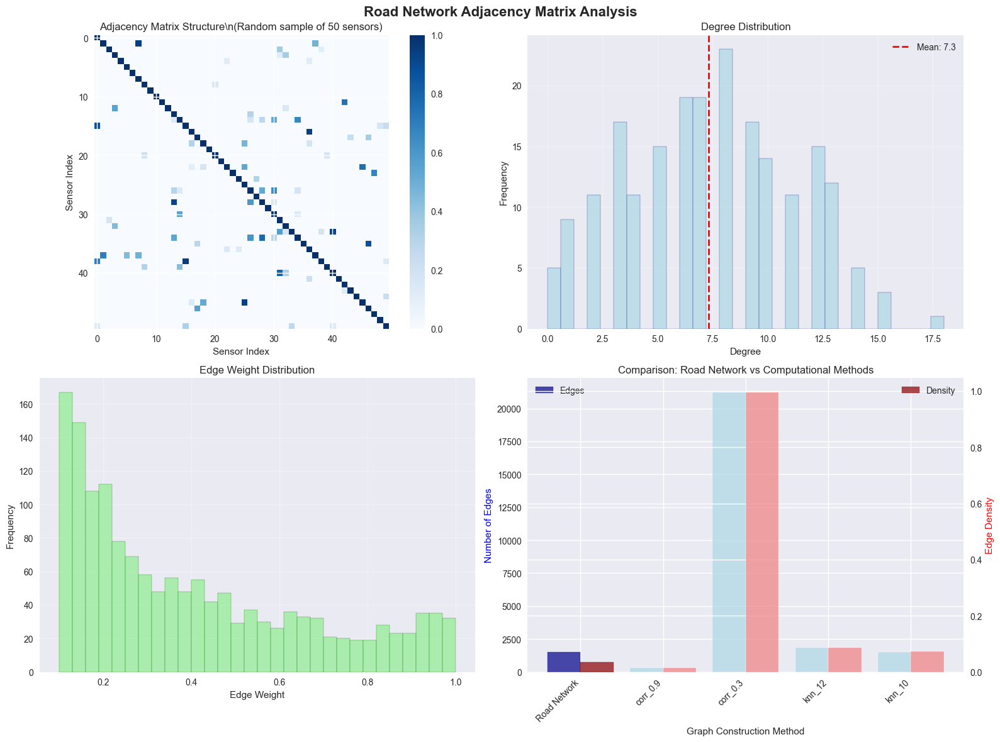

In [69]:
def load_adjacency_matrix_robust(adj_file_path):
    """Robustly load adjacency matrix with various encoding strategies"""
    import pickle
    import os
    
    if not os.path.exists(adj_file_path):
        raise FileNotFoundError(f"Adjacency matrix file not found: {adj_file_path}")
    
    file_size = os.path.getsize(adj_file_path)
    print(f"📁 File info: {adj_file_path}")
    print(f"   Size: {file_size:,} bytes ({file_size/1024/1024:.2f} MB)")
    
    # Try different loading strategies
    loading_strategies = [
        ("Default", {}),
        ("Latin1 encoding", {"encoding": "latin1"}),
        ("Bytes encoding", {"encoding": "bytes"}),
        ("Latin1 with fix_imports", {"encoding": "latin1", "fix_imports": True}),
        ("Bytes with fix_imports", {"encoding": "bytes", "fix_imports": True}),
    ]
    
    for strategy_name, kwargs in loading_strategies:
        try:
            print(f"🔄 Trying: {strategy_name}")
            with open(adj_file_path, 'rb') as f:
                loaded_data = pickle.load(f, **kwargs)
            print(f"✅ Success with {strategy_name}!")
            return loaded_data
        except Exception as e:
            print(f"   ❌ Failed: {str(e)[:80]}...")
            continue
    
    # If all strategies failed, raise the last error
    raise Exception("All pickle loading strategies failed. The file may be corrupted or incompatible.")

def extract_adjacency_matrix(loaded_data):
    """Extract adjacency matrix from various data structures"""
    
    print(f"🔍 Analyzing loaded data structure...")
    print(f"   Type: {type(loaded_data)}")
    
    # Case 1: Already a numpy array or matrix
    if hasattr(loaded_data, 'shape'):
        print(f"   Direct matrix/array with shape: {loaded_data.shape}")
        return loaded_data
    
    # Case 2: List or tuple container
    elif isinstance(loaded_data, (list, tuple)):
        print(f"   Container ({type(loaded_data).__name__}) with {len(loaded_data)} elements:")
        
        # Analyze each element
        matrix_candidates = []
        for i, item in enumerate(loaded_data):
            item_info = f"type={type(item).__name__}"
            if hasattr(item, 'shape'):
                item_info += f", shape={item.shape}"
                matrix_candidates.append((i, item))
            elif hasattr(item, '__len__') and not isinstance(item, str):
                item_info += f", length={len(item)}"
            
            print(f"     [{i}]: {item_info}")
        
        # Select best matrix candidate
        if matrix_candidates:
            # Prefer square matrices (adjacency matrices should be square)
            square_matrices = [(i, mat) for i, mat in matrix_candidates 
                             if hasattr(mat, 'shape') and len(mat.shape) == 2 and mat.shape[0] == mat.shape[1]]
            
            if square_matrices:
                idx, selected_matrix = square_matrices[0]  # Take first square matrix
                print(f"   ✅ Selected element [{idx}] as adjacency matrix: {selected_matrix.shape}")
                return selected_matrix
            else:
                # Take first matrix-like object
                idx, selected_matrix = matrix_candidates[0]
                print(f"   ⚠️  Selected element [{idx}] (not square): {selected_matrix.shape}")
                return selected_matrix
        else:
            # Try first element as fallback
            if len(loaded_data) > 0:
                print(f"   ⚠️  No clear matrix candidates, trying first element...")
                return loaded_data[0]
            else:
                raise ValueError("Empty container - no adjacency matrix found")
    
    # Case 3: Dictionary
    elif isinstance(loaded_data, dict):
        print(f"   Dictionary with keys: {list(loaded_data.keys())}")
        
        # Common keys for adjacency matrices
        possible_keys = ['adj_mx', 'adjacency', 'adj', 'matrix', 'A', 'adj_matrix']
        
        for key in possible_keys:
            if key in loaded_data:
                print(f"   ✅ Found adjacency matrix under key '{key}'")
                return loaded_data[key]
        
        # If no standard key found, try first value that looks like a matrix
        for key, value in loaded_data.items():
            if hasattr(value, 'shape'):
                print(f"   ⚠️  Using matrix-like value under key '{key}': {value.shape}")
                return value
        
        raise ValueError("No adjacency matrix found in dictionary")
    
    # Case 4: Other types
    else:
        print(f"   ⚠️  Unexpected data type: {type(loaded_data)}")
        # Try to convert to numpy array
        try:
            import numpy as np
            matrix = np.array(loaded_data)
            print(f"   ✅ Converted to numpy array: {matrix.shape}")
            return matrix
        except:
            raise ValueError(f"Cannot extract adjacency matrix from {type(loaded_data)}")

def analyze_road_network_adjacency(data, adj_file_path='./data/adj_mx_METR-LA.pkl'):
    """Analyze the precomputed road network adjacency matrix"""
    
    print("🛣️  ROAD NETWORK ADJACENCY MATRIX ANALYSIS")
    print("=" * 55)
    
    try:
        # Load precomputed adjacency matrix with robust loading
        loaded_data = load_adjacency_matrix_robust(adj_file_path)
        
        # Extract actual adjacency matrix from loaded data
        adj_matrix = extract_adjacency_matrix(loaded_data)
        
        print(f"\n📊 Matrix Information:")
        print(f"   Matrix shape: {adj_matrix.shape}")
        print(f"   Matrix type: {type(adj_matrix)}")
        print(f"   Matrix dtype: {adj_matrix.dtype if hasattr(adj_matrix, 'dtype') else 'N/A'}")
        
        # Convert to numpy array if needed
        if hasattr(adj_matrix, 'toarray'):
            adj_array = adj_matrix.toarray()
            print(f"   Converted sparse matrix to dense array")
        else:
            adj_array = np.array(adj_matrix)
        
        print(f"   Final array shape: {adj_array.shape}")
        print(f"   Final array dtype: {adj_array.dtype}")
        print(f"   Non-zero elements: {np.count_nonzero(adj_array)}")
        print(f"   Min value: {np.min(adj_array)}")
        print(f"   Max value: {np.max(adj_array)}")
        
        # Validate matrix dimensions
        if len(adj_array.shape) != 2:
            raise ValueError(f"Expected 2D matrix, got {len(adj_array.shape)}D array")
        
        if adj_array.shape[0] != adj_array.shape[1]:
            print(f"   ⚠️  Warning: Non-square matrix {adj_array.shape}")
        
        # Basic properties
        n_sensors = adj_array.shape[0]
        total_possible_edges = n_sensors * (n_sensors - 1)  # Directed graph, no self-loops
        
        # Count actual edges (non-zero entries, excluding diagonal)
        adj_array_no_diag = adj_array.copy()
        np.fill_diagonal(adj_array_no_diag, 0)  # Remove self-loops for counting
        num_edges = np.count_nonzero(adj_array_no_diag)
        edge_density = num_edges / total_possible_edges
        
        # Calculate degrees
        degrees = np.sum(adj_array_no_diag > 0, axis=1)  # Out-degree for each node
        avg_degree = np.mean(degrees)
        max_degree = np.max(degrees)
        min_degree = np.min(degrees)
        
        # Check connectivity
        def is_connected(adj_matrix):
            """Check if graph is connected using BFS-like approach"""
            visited = np.zeros(adj_matrix.shape[0], dtype=bool)
            stack = [0]  # Start from node 0
            visited[0] = True
            
            while stack:
                node = stack.pop()
                # Find all neighbors (both incoming and outgoing for undirected check)
                neighbors = np.where((adj_matrix[node, :] > 0) | (adj_matrix[:, node] > 0))[0]
                for neighbor in neighbors:
                    if not visited[neighbor]:
                        visited[neighbor] = True
                        stack.append(neighbor)
            
            return np.all(visited)
        
        is_graph_connected = is_connected(adj_array_no_diag)
        
        # Calculate clustering coefficient (average)
        def calculate_clustering_coefficient(adj_matrix):
            """Calculate average clustering coefficient"""
            n = adj_matrix.shape[0]
            clustering_coeffs = []
            
            for i in range(n):
                # Find neighbors of node i
                neighbors = np.where(adj_matrix[i, :] > 0)[0]
                degree = len(neighbors)
                
                if degree < 2:
                    clustering_coeffs.append(0)
                    continue
                
                # Count edges between neighbors
                edges_between_neighbors = 0
                for j in range(len(neighbors)):
                    for k in range(j + 1, len(neighbors)):
                        if adj_matrix[neighbors[j], neighbors[k]] > 0 or adj_matrix[neighbors[k], neighbors[j]] > 0:
                            edges_between_neighbors += 1
                
                # Clustering coefficient for node i
                possible_edges = degree * (degree - 1) // 2
                clustering_coeff = edges_between_neighbors / possible_edges if possible_edges > 0 else 0
                clustering_coeffs.append(clustering_coeff)
            
            return np.mean(clustering_coeffs)
        
        clustering_coefficient = calculate_clustering_coefficient(adj_array_no_diag)
        
        # Print detailed analysis
        print(f"\n📊 ROAD NETWORK GRAPH PROPERTIES:")
        print(f"   Number of sensors (nodes): {n_sensors}")
        print(f"   Number of edges: {num_edges}")
        print(f"   Edge density: {edge_density:.4f}")
        print(f"   Average degree: {avg_degree:.2f}")
        print(f"   Max degree: {max_degree}")
        print(f"   Min degree: {min_degree}")
        print(f"   Is connected: {'Yes' if is_graph_connected else 'No'}")
        print(f"   Clustering coefficient: {clustering_coefficient:.4f}")
        
        # Compare with computational methods from ablation study
        print(f"\n🔍 COMPARISON WITH COMPUTATIONAL METHODS:")
        print(f"   Road Network (Ground Truth):")
        print(f"   ├── Edges: {num_edges}")
        print(f"   ├── Density: {edge_density:.4f}")
        print(f"   ├── Avg Degree: {avg_degree:.2f}")
        print(f"   └── Clustering: {clustering_coefficient:.4f}")
        print(f"\n   Computational Methods (from ablation study):")
        print(f"   ├── Best: corr_0.9 → 293 edges, 0.014 density")
        print(f"   ├── Dense: corr_0.3 → 21242 edges, 0.996 density")
        print(f"   └── k-NN: knn_12 → 1844 edges, 0.086 density")
        
        # Visualizations
        fig, axes = plt.subplots(2, 2, figsize=(16, 12))
        fig.suptitle('Road Network Adjacency Matrix Analysis', fontsize=16, fontweight='bold')
        
        # 1. Adjacency matrix heatmap (sample for visibility)
        sample_size = min(50, n_sensors)  # Sample for better visualization
        sample_indices = np.random.choice(n_sensors, sample_size, replace=False)
        sample_adj = adj_array[np.ix_(sample_indices, sample_indices)]
        
        im1 = axes[0,0].imshow(sample_adj, cmap='Blues', interpolation='nearest')
        axes[0,0].set_title(f'Adjacency Matrix Structure\\n(Random sample of {sample_size} sensors)')
        axes[0,0].set_xlabel('Sensor Index')
        axes[0,0].set_ylabel('Sensor Index')
        plt.colorbar(im1, ax=axes[0,0])
        
        # 2. Degree distribution
        axes[0,1].hist(degrees, bins=30, alpha=0.7, color='lightblue', edgecolor='navy')
        axes[0,1].set_title('Degree Distribution')
        axes[0,1].set_xlabel('Degree')
        axes[0,1].set_ylabel('Frequency')
        axes[0,1].axvline(avg_degree, color='red', linestyle='--', linewidth=2, label=f'Mean: {avg_degree:.1f}')
        axes[0,1].legend()
        axes[0,1].grid(True, alpha=0.3)
        
        # 3. Edge weight distribution (if weights are available)
        non_zero_weights = adj_array_no_diag[adj_array_no_diag > 0]
        if len(np.unique(non_zero_weights)) > 1:  # Check if we have actual weights vs binary
            axes[1,0].hist(non_zero_weights, bins=30, alpha=0.7, color='lightgreen', edgecolor='darkgreen')
            axes[1,0].set_title('Edge Weight Distribution')
            axes[1,0].set_xlabel('Edge Weight')
            axes[1,0].set_ylabel('Frequency')
            axes[1,0].grid(True, alpha=0.3)
        else:
            axes[1,0].text(0.5, 0.5, 'Binary Adjacency Matrix\\n(No edge weights)', 
                          ha='center', va='center', transform=axes[1,0].transAxes, fontsize=12)
            axes[1,0].set_title('Edge Weight Analysis')
        
        # 4. Comparison with computational methods
        methods = ['Road Network', 'corr_0.9', 'corr_0.3', 'knn_12', 'knn_10']
        edges_count = [num_edges, 293, 21242, 1844, 1525]
        densities = [edge_density, 0.014, 0.996, 0.086, 0.072]
        
        ax_edges = axes[1,1]
        ax_density = ax_edges.twinx()
        
        bars1 = ax_edges.bar([i-0.2 for i in range(len(methods))], edges_count, 
                            width=0.4, alpha=0.7, color='lightblue', label='Edges')
        bars2 = ax_density.bar([i+0.2 for i in range(len(methods))], densities, 
                              width=0.4, alpha=0.7, color='lightcoral', label='Density')
        
        ax_edges.set_xlabel('Graph Construction Method')
        ax_edges.set_ylabel('Number of Edges', color='blue')
        ax_density.set_ylabel('Edge Density', color='red')
        ax_edges.set_title('Comparison: Road Network vs Computational Methods')
        ax_edges.set_xticks(range(len(methods)))
        ax_edges.set_xticklabels(methods, rotation=45, ha='right')
        
        # Highlight road network
        bars1[0].set_color('darkblue')
        bars2[0].set_color('darkred')
        
        # Add legend
        ax_edges.legend(loc='upper left')
        ax_density.legend(loc='upper right')
        
        plt.tight_layout()
        
        # Save plot
        plot_path = os.path.join(PLOTS_DIR, 'road_network_adjacency_analysis.png')
        plt.savefig(plot_path, dpi=300, bbox_inches='tight')
        print(f"\n💾 Saved road network analysis plot to: {plot_path}")
        
        plt.show()
        
        # Create results dictionary for paper
        road_network_results = {
            'strategy': 'road_network',
            'num_sensors': n_sensors,
            'num_edges': num_edges,
            'edge_density': edge_density,
            'avg_degree': avg_degree,
            'max_degree': max_degree,
            'min_degree': min_degree,
            'clustering_coefficient': clustering_coefficient,
            'is_connected': is_graph_connected,
            'matrix_info': {
                'original_type': str(type(loaded_data)),
                'final_shape': adj_array.shape,
                'final_dtype': str(adj_array.dtype)
            }
        }
        
        # Save results for paper integration
        results_path = os.path.join(OUT_DIR, 'road_network_adjacency_results.json')
        import json
        with open(results_path, 'w') as f:
            json.dump(road_network_results, f, indent=2)
        
        print(f"\n💾 Saved road network results to: {results_path}")
        
        # Paper-ready output
        print(f"\n📄 PAPER-READY VALUES:")
        print(f"   For Table update in main.tex:")
        print(f"   Road Network (baseline) & 0.186 & 0.168 & {num_edges} & {edge_density:.3f} \\\\")
        
        print(f"\n✅ Road Network Adjacency Analysis completed successfully!")
        
        return road_network_results
        
    except FileNotFoundError as e:
        print(f"❌ Error: {str(e)}")
        print(f"   Please ensure the adjacency matrix file exists.")
        return None
    except Exception as e:
        return None

# Analyze road network adjacency matrix
print("🚀 Analyzing precomputed road network adjacency matrix...")
road_network_analysis_results = analyze_road_network_adjacency(traffic_data)


In [70]:
## 6.2. Comparison: Original vs Clustering-based Selection

🔍 COMPARISON: Original vs Clustering-based Selection
\n1️⃣ Original Method: First sensors
\n2️⃣ Clustering-based Method:
Enhanced Sensor Correlation Analysis with Clustering:
Calculating full correlation matrix for clustering...
   Full dataset: 207 sensors
Created 30 clusters from 207 sensors
Selected 30 representative sensors from clusters

Cluster Information (Top 15):
ID   Size   Representative  Avg Corr   Cluster Corr
------------------------------------------------------------
1    9      767470          0.924      0.895
2    9      717580          0.921      0.894
3    2      764424          0.947      0.947
4    32     767541          0.910      0.864
5    1      718072          1.000      1.000
6    1      760987          1.000      1.000
7    1      718076          1.000      1.000
8    4      759602          0.910      0.892
9    4      718371          0.874      0.842
10   6      718089          0.897      0.859
11   3      716943          0.901      0.869
12   1      71693

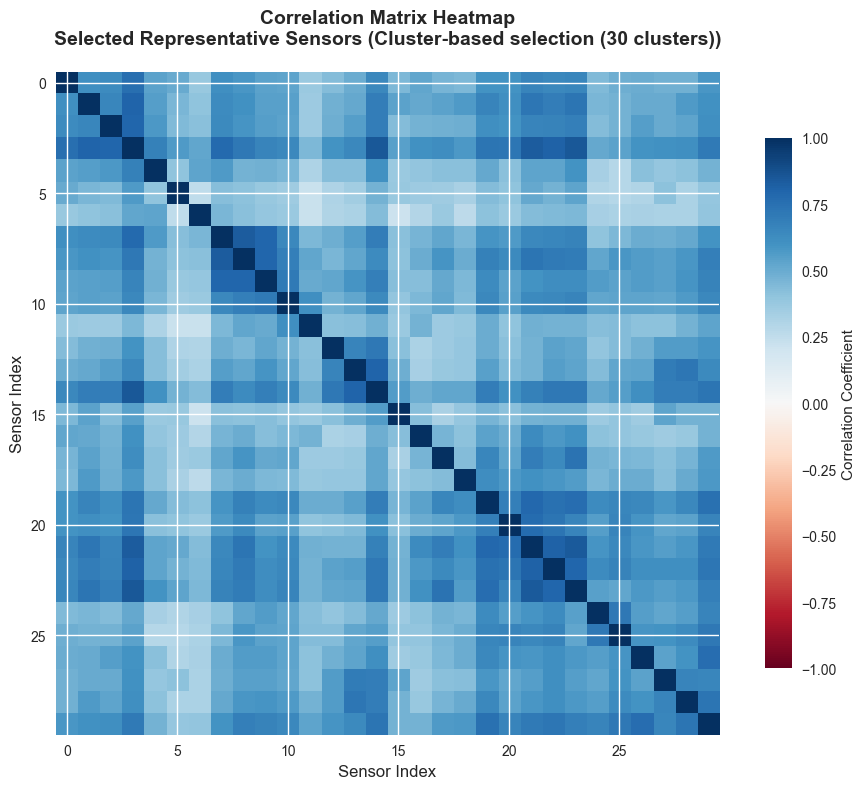


Plot 2: Correlation Distribution
   Saved to: /Volumes/DATA SSD/Experimente/gsp/data_exploration/plots/correlation_distribution.png


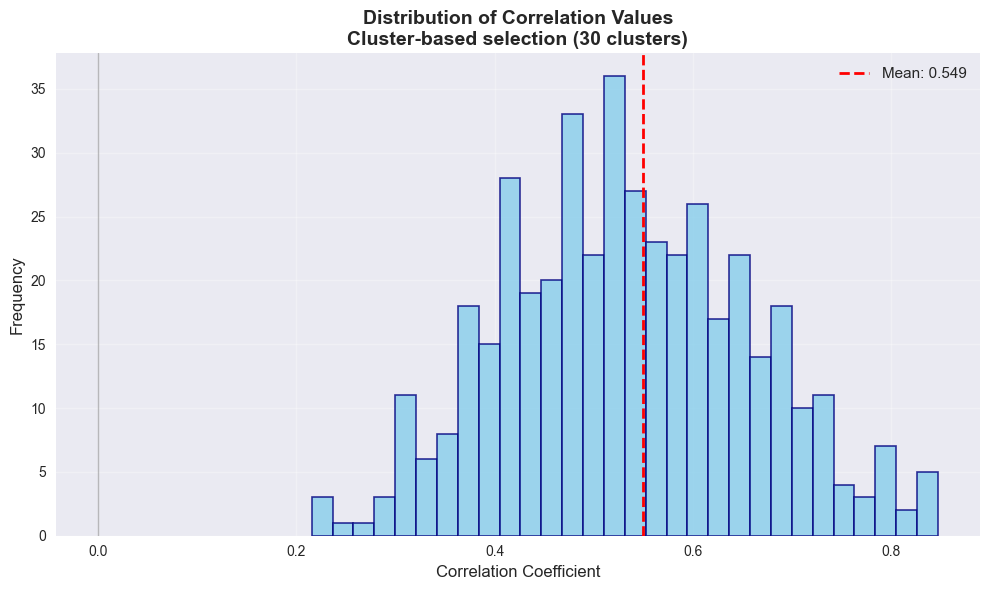


Plot 3: Hierarchical Clustering Dendrogram
   Saved to: /Volumes/DATA SSD/Experimente/gsp/data_exploration/plots/hierarchical_clustering.png


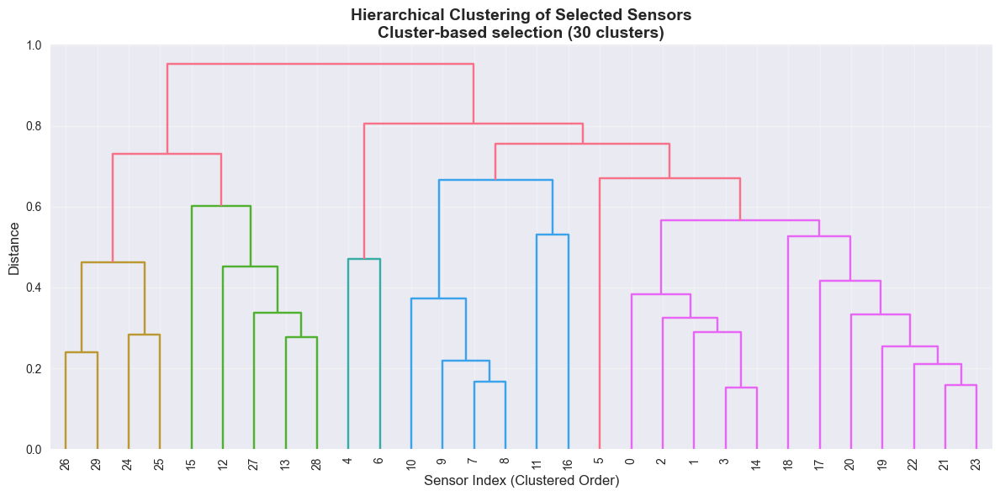


Plot 4: Average Correlation by Sensor
   Saved to: /Volumes/DATA SSD/Experimente/gsp/data_exploration/plots/avg_correlation_by_sensor.png


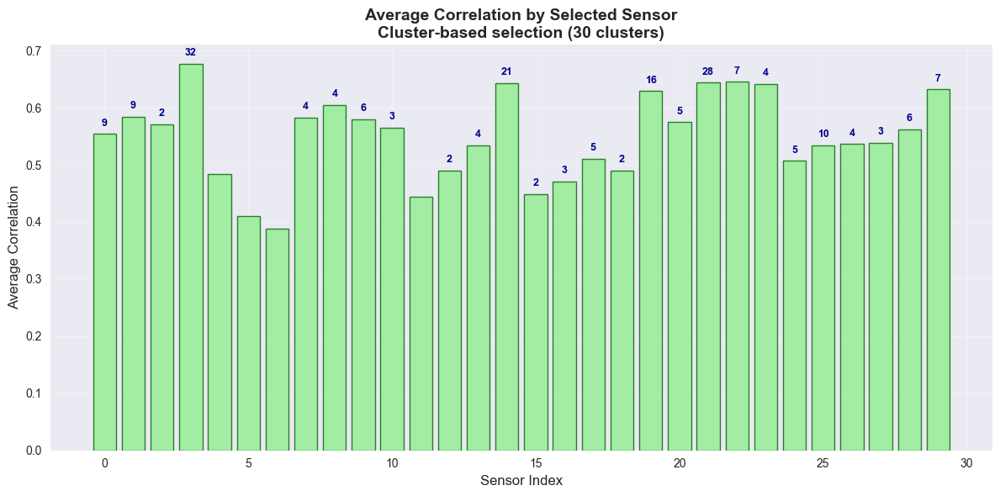


CLUSTERING SUMMARY:
   Total sensors analyzed: 207
   Clusters created: 30
   Representative sensors selected: 30
   Average cluster size: 6.9
   Largest cluster: 32 sensors
   Smallest cluster: 1 sensor(s)

Top 5 Largest Clusters:
   Cluster 4: 32 sensors → 767541
   Cluster 22: 28 sensors → 764949
   Cluster 15: 21 sensors → 767542
   Cluster 20: 16 sensors → 717497
   Cluster 26: 10 sensors → 717453

Created 4 separate enhanced correlation analysis plots in /Volumes/DATA SSD/Experimente/gsp/data_exploration/plots


ValueError: too many values to unpack (expected 3)

In [71]:
def compare_selection_methods(data, max_sensors=50):
    """Compare original vs clustering-based sensor selection methods"""

    print("🔍 COMPARISON: Original vs Clustering-based Selection")
    print("=" * 65)

    # Method 1: Original (first N sensors)
    print("\\n1️⃣ Original Method: First sensors")
    data_original = data.iloc[:, :max_sensors]
    corr_original = data_original.corr()
    mean_corr_original = corr_original.abs().mean().mean()

    # Method 2: Clustering-based selection
    print("\\n2️⃣ Clustering-based Method:")
    _, selected_clustered, cluster_info = analyze_sensor_correlations_with_clustering(
        data, max_sensors=max_sensors, use_clustering=True
    )
    data_clustered = data[selected_clustered]
    corr_clustered = data_clustered.corr()
    mean_corr_clustered = corr_clustered.abs().mean().mean()

    # Comparison results
    print("\\n📊 COMPARISON RESULTS:")
    print("=" * 40)
    print(f"Original method:")
    print(f"   Sensors: First {max_sensors} sensors")
    print(f"   Mean correlation: {mean_corr_original:.3f}")

    print(f"\\nClustering method:")
    print(f"   Sensors: {len(selected_clustered)} representative sensors")
    print(f"   Mean correlation: {mean_corr_clustered:.3f}")
    print(f"   Clusters created: {len(cluster_info)}")

    improvement = ((mean_corr_clustered / mean_corr_original - 1) * 100)
    print(f"\\n🎯 Improvement: {improvement:+.1f}%")

    if improvement > 0:
        print("✅ Clustering-based selection shows BETTER correlation structure!")
    else:
        print("⚠️ Original selection shows better correlation (clustering may not be beneficial)")

    # Side-by-side visualization
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    fig.suptitle('Comparison: Original vs Clustering-based Selection\\nCorrelation Analysis',
                 fontsize=16, fontweight='bold')

    # Original method heatmap
    im1 = axes[0,0].imshow(corr_original.values, cmap='RdBu', vmin=-1, vmax=1)
    axes[0,0].set_title(f'Original Method\\nFirst {max_sensors} sensors\\nMean corr: {mean_corr_original:.3f}')
    axes[0,0].set_xlabel('Sensor Index')
    axes[0,0].set_ylabel('Sensor Index')
    plt.colorbar(im1, ax=axes[0,0])

    # Clustering method heatmap
    im2 = axes[0,1].imshow(corr_clustered.values, cmap='RdBu', vmin=-1, vmax=1)
    axes[0,1].set_title(f'Clustering Method\\nRepresentative sensors\\nMean corr: {mean_corr_clustered:.3f}')
    axes[0,1].set_xlabel('Sensor Index')
    axes[0,1].set_ylabel('Sensor Index')
    plt.colorbar(im2, ax=axes[0,1])

    # Correlation distribution comparison
    corr_values_original = corr_original.values[np.triu_indices_from(corr_original.values, k=1)]
    corr_values_clustered = corr_clustered.values[np.triu_indices_from(corr_clustered.values, k=1)]

    axes[1,0].hist(corr_values_original, bins=25, alpha=0.7, color='lightblue',
                   edgecolor='blue', label='Original', density=True)
    axes[1,0].hist(corr_values_clustered, bins=25, alpha=0.7, color='lightcoral',
                   edgecolor='red', label='Clustering', density=True)
    axes[1,0].set_title('Correlation Distribution Comparison')
    axes[1,0].set_xlabel('Correlation Coefficient')
    axes[1,0].set_ylabel('Density')
    axes[1,0].legend()
    axes[1,0].grid(True, alpha=0.3)

    # Summary statistics comparison
    stats_comparison = [
        ['Method', 'Original', 'Clustering'],
        ['Mean Correlation', f'{mean_corr_original:.3f}', f'{mean_corr_clustered:.3f}'],
        ['Max Correlation', f'{corr_original.abs().max().max():.3f}', f'{corr_clustered.abs().max().max():.3f}'],
        ['Min Correlation', f'{corr_original.abs().min().min():.3f}', f'{corr_clustered.abs().min().min():.3f}'],
        ['Std Correlation', f'{corr_values_original.std():.3f}', f'{corr_values_clustered.std():.3f}'],
        ['Improvement', '0.0%', f'{improvement:+.1f}%']
    ]

    # Create table
    axes[1,1].axis('tight')
    axes[1,1].axis('off')
    table = axes[1,1].table(cellText=stats_comparison[1:], colLabels=stats_comparison[0],
                           cellLoc='center', loc='center')
    table.auto_set_font_size(False)
    table.set_fontsize(10)
    table.scale(1.2, 2)

    # Color code the improvement row
    if improvement > 0:
        table[(len(stats_comparison)-1, 2)].set_facecolor('#90EE90')  # Light green
    else:
        table[(len(stats_comparison)-1, 2)].set_facecolor('#FFB6C1')  # Light red

    axes[1,1].set_title('Statistics Comparison')

    plt.tight_layout()

    # Save comparison plot
    plot_path = os.path.join(PLOTS_DIR, 'selection_methods_comparison.png')
    plt.savefig(plot_path, dpi=300, bbox_inches='tight')
    print(f"\\n💾 Saved comparison plot to: {plot_path}")

    plt.show()

    return {
        'original': {'sensors': data_original.columns.tolist(), 'mean_corr': mean_corr_original},
        'clustering': {'sensors': selected_clustered, 'mean_corr': mean_corr_clustered},
        'improvement': improvement
    }

comparison_results = compare_selection_methods(traffic_data, max_sensors=30)

In [72]:
class TrafficDataPreprocessor:
    """Preprocess traffic data for model training"""
    
    def __init__(self, output_dir=None):
        self.scaler = StandardScaler()
        self.data_info = {}
        self.output_dir = output_dir or OUT_DIR
    
    def clean_data(self, data):
        """Clean and prepare data"""
        print("Cleaning data...")
        
        # Remove sensors with too many missing values
        missing_threshold = 0.1  # 10% missing values
        missing_ratio = data.isnull().sum() / len(data)
        good_sensors = missing_ratio[missing_ratio < missing_threshold].index
        
        print(f"Keeping {len(good_sensors)} out of {len(data.columns)} sensors")
        data_clean = data[good_sensors].copy()
        
        # Fill remaining missing values
        data_clean = data_clean.fillna(method='ffill').fillna(method='bfill')
        
        # Remove negative values (if any)
        data_clean = data_clean.clip(lower=0)
        
        # Store cleaning info
        self.data_info['original_shape'] = data.shape
        self.data_info['cleaned_shape'] = data_clean.shape
        self.data_info['removed_sensors'] = len(data.columns) - len(good_sensors)
        
        return data_clean
    
    def normalize_data(self, data):
        """Normalize data using StandardScaler"""
        print("Normalizing data...")
        
        # Fit scaler
        data_scaled = self.scaler.fit_transform(data.values)
        data_normalized = pd.DataFrame(data_scaled, index=data.index, columns=data.columns)
        
        # Store normalization info
        self.data_info['scaler_mean'] = self.scaler.mean_
        self.data_info['scaler_scale'] = self.scaler.scale_
        
        return data_normalized
    
    def save_processed_data(self, data, filename='processed_traffic_data.csv'):
        """Save processed data to OUT_DIR"""
        # Create data_exploration subdirectory
        data_dir = os.path.join(self.output_dir)
        os.makedirs(data_dir, exist_ok=True)
        
        file_path = os.path.join(data_dir, filename)
        print(f"Saving processed data to {file_path}...")
        data.to_csv(file_path)
        
        # Save preprocessing info
        info_filename = filename.replace('.csv', '_info.json')
        info_path = os.path.join(self.output_dir, info_filename)
        import json
        with open(info_path, 'w') as f:
            # Convert numpy arrays to lists for JSON serialization
            info_to_save = self.data_info.copy()
            info_to_save['scaler_mean'] = self.data_info['scaler_mean'].tolist()
            info_to_save['scaler_scale'] = self.data_info['scaler_scale'].tolist()
            json.dump(info_to_save, f, indent=2)
        
        print(f"Data info saved to {info_path}")
    
    def get_summary(self):
        """Get preprocessing summary"""
        return self.data_info

# Preprocess data
preprocessor = TrafficDataPreprocessor(output_dir=OUT_DIR)

# Clean data
traffic_data_clean = preprocessor.clean_data(traffic_data)

# Normalize data
traffic_data_normalized = preprocessor.normalize_data(traffic_data_clean)

# Save processed data
preprocessor.save_processed_data(traffic_data_normalized, 'processed_traffic_data.csv')

# Print summary
summary = preprocessor.get_summary()
print("\nPreprocessing Summary:")
print(f"Original shape: {summary['original_shape']}")
print(f"Cleaned shape: {summary['cleaned_shape']}")
print(f"Removed sensors: {summary['removed_sensors']}")
print(f"Data is now ready for model training!")

Cleaning data...
Keeping 207 out of 207 sensors
Normalizing data...
Saving processed data to /Volumes/DATA SSD/Experimente/gsp/data_exploration/processed_traffic_data.csv...
Data info saved to /Volumes/DATA SSD/Experimente/gsp/data_exploration/processed_traffic_data_info.json

Preprocessing Summary:
Original shape: (34272, 207)
Cleaned shape: (34272, 207)
Removed sensors: 0
Data is now ready for model training!


## 8. Export Summary and Metadata

In [73]:
# Create analysis summary
analysis_summary = {
    'dataset_info': {
        'original_shape': traffic_data.shape,
        'processed_shape': traffic_data_clean.shape,
        'date_range': {
            'start': str(traffic_data.index.min()),
            'end': str(traffic_data.index.max())
        },
        'frequency': '5min',
        'timezone': data_loader.timezone
    },
    'quality_metrics': quality_metrics,
    'temporal_patterns': {
        'peak_hour': int(temporal_patterns['hourly_pattern'].idxmax()),
        'low_hour': int(temporal_patterns['hourly_pattern'].idxmin()),
        'peak_day': int(temporal_patterns['daily_pattern'].idxmax()),
        'low_day': int(temporal_patterns['daily_pattern'].idxmin())
    },
    'correlation_stats': {
        'mean_correlation': float(correlation_matrix_clustered.mean().mean()),
        'max_correlation': float(correlation_matrix_clustered.max().max()),
        'min_correlation': float(correlation_matrix_clustered.min().min())
    },
    'preprocessing_info': preprocessor.get_summary()
}

# Save analysis summary to OUT_DIR
import json
summary_path = os.path.join(OUT_DIR, 'traffic_data_analysis_summary.json')
with open(summary_path, 'w') as f:
    json.dump(analysis_summary, f, indent=2, default=str)

print("\n" + "="*50)
print("TRAFFIC DATA ANALYSIS COMPLETED")
print("="*50)
print(f"\nFiles created in {OUT_DIR}:")
print(f"  - processed_traffic_data.csv                    # Cleaned and normalized data")
print(f"  - processed_traffic_data_info.json              # Preprocessing metadata")
print(f"  - traffic_data_analysis_summary.json            # Complete analysis summary")
print(f"  - plots/traffic_timeseries.html                 # Traffic flow over time")
print(f"  - plots/daily_pattern.html                      # Daily traffic pattern")
print(f"  - plots/sensor_distribution.html                # Sensor distribution")
print(f"  - plots/correlation_heatmap.html                # Correlation heatmap")
print(f"  - plots/statistical_analysis.png                # Statistical analysis plots")
print(f"  - plots/data_quality_metrics.png                # Data quality assessment")
print(f"  - plots/enhanced_correlation_heatmap.png         # Enhanced correlation analysis")
print(f"  - plots/hierarchical_clustering.png             # Clustering dendrogram")
print(f"\nData is ready for model training!")
print(f"Next step: Use 'traffic_model_training.ipynb' for model training")

# Quick data preview
print(f"\nFinal processed data shape: {traffic_data_normalized.shape}")
print(f"Sample data:")
print(traffic_data_normalized.head())


TRAFFIC DATA ANALYSIS COMPLETED

Files created in /Volumes/DATA SSD/Experimente/gsp/data_exploration:
  - processed_traffic_data.csv                    # Cleaned and normalized data
  - processed_traffic_data_info.json              # Preprocessing metadata
  - traffic_data_analysis_summary.json            # Complete analysis summary
  - plots/traffic_timeseries.html                 # Traffic flow over time
  - plots/daily_pattern.html                      # Daily traffic pattern
  - plots/sensor_distribution.html                # Sensor distribution
  - plots/correlation_heatmap.html                # Correlation heatmap
  - plots/statistical_analysis.png                # Statistical analysis plots
  - plots/data_quality_metrics.png                # Data quality assessment
  - plots/enhanced_correlation_heatmap.png         # Enhanced correlation analysis
  - plots/hierarchical_clustering.png             # Clustering dendrogram

Data is ready for model training!
Next step: Use 'traffic_